pixdim[1,2,3] should be non-zero; setting 0 dims to 1


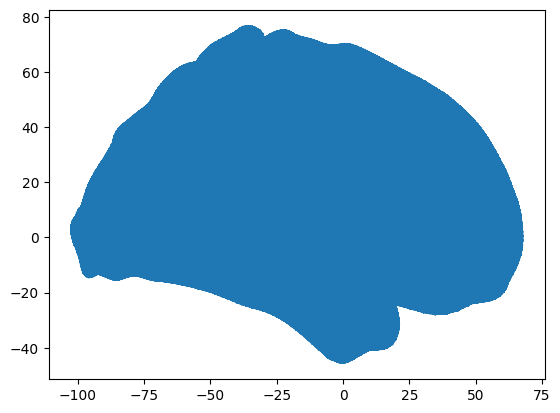

In [1]:
import matplotlib.pyplot as plt
import hcp_utils as hcp

vertices, faces = hcp.mesh.midthickness


# Create a figure and axis
fig, ax = plt.subplots()

# Plot the mesh
ax.triplot(vertices[:, 1], vertices[:, 2], faces)

# Display the plot
plt.show()

In [3]:
%matplotlib tk

import trimesh
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


# Create a figure and 3D axis
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the mesh
ax.plot_trisurf(vertices[:, 0], vertices[:, 1], vertices[:, 2], triangles=faces, linewidth=0.2, antialiased=True)

# Determine bounds from vertices
min_bounds = vertices.min(axis=0)
max_bounds = vertices.max(axis=0)

# Set axis limits based on mesh bounds
ax.set_xlim([min_bounds[0], max_bounds[0]])
ax.set_ylim([min_bounds[1], max_bounds[1]])
ax.set_zlim([min_bounds[2], max_bounds[2]])

# Display the plot
plt.show()


In [142]:
import plotly.graph_objects as go
import numpy as np

view = "lateral"
vertex_data = np.arange(len(vertices))


def determine_eye_position(view):
    if view == "posterior":
        return dict(x=0, y=-1.5, z=0)
    elif view == "lateral_right" or view == "lateral":
        return dict(x=1.5, y=0, z=0)
    elif view == "lateral_left":
        return dict(x=-1.5, y=0, z=0)
    elif view == "medial_left":
        return dict(x=-1.5, y=0, z=0)
    elif view == "medial_right" or view == "medial":
        return dict(x=1.5, y=0, z=0)
    elif view == "superior":
        return dict(x=0, y=0, z=1.5)
    elif view == "inferior":
        return dict(x=0, y=0, z=-1.5)


def plot_data_on_mesh(vertices, faces, data, view="lateral_left", animation=False):
    x, y, z = vertices.T
    colorscale = "Viridis"
    colorbar_title = "Data Value"

    if animation and len(data.shape) == 2:
        frames = [
            go.Frame(
                data=[
                    go.Mesh3d(
                        x=x,
                        y=y,
                        z=z,
                        i=faces[:, 0],
                        j=faces[:, 1],
                        k=faces[:, 2],
                        intensity=data[:, t],
                        colorscale=colorscale,
                        cmin=np.min(data),
                        cmax=np.max(data),
                        opacity=1,
                        colorbar_title=colorbar_title,
                    )
                ],
                name=str(t),
            )
            for t in range(data.shape[1])
        ]

        fig = go.Figure(
            data=[
                go.Mesh3d(
                    x=x,
                    y=y,
                    z=z,
                    i=faces[:, 0],
                    j=faces[:, 1],
                    k=faces[:, 2],
                    intensity=data[:, 0],  # start with the first time step
                    colorscale=colorscale,
                    cmin=np.min(data),
                    cmax=np.max(data),
                    opacity=1,
                    colorbar_title=colorbar_title,
                )
            ],
            layout=go.Layout(
                updatemenu=[
                    dict(
                        type="buttons",
                        showactive=False,
                        buttons=[
                            dict(
                                label="Play",
                                method="animate",
                                args=[
                                    None,
                                    dict(
                                        frame=dict(duration=100, redraw=True),
                                        fromcurrent=True,
                                    ),
                                ],
                            )
                        ],
                    )
                ],
                frames=frames,
            ),
        )

    else:
        mesh = go.Mesh3d(
            x=x,
            y=y,
            z=z,
            i=faces[:, 0],
            j=faces[:, 1],
            k=faces[:, 2],
            intensity=data,
            colorscale=colorscale,
            cmin=np.min(data),
            cmax=np.max(data),
            opacity=1,
            colorbar_title=colorbar_title,
        )

        fig = go.Figure(mesh)

    if not show_colorbar:
        mesh.colorbar = None

    if fig and row and col:
        fig.add_trace(mesh, row=row, col=col)
    else:
        fig = go.Figure(mesh)

    # Remove axes ticks and grid
    fig.update_layout(
        scene=dict(
            xaxis=dict(
                nticks=0,
                showgrid=False,
                showbackground=False,
                showticklabels=False,
                title="",
                range=[min(x), max(x)],
            ),
            yaxis=dict(
                nticks=0,
                showgrid=False,
                showbackground=False,
                showticklabels=False,
                title="",
                range=[min(y), max(y)],
            ),
            zaxis=dict(
                nticks=0,
                showgrid=False,
                showbackground=False,
                showticklabels=False,
                title="",
                range=[min(z), max(z)],
            ),
        )
    )

    # Compute the aspect ratio based on actual data range
    aspect_ratio = dict(
        x=(max(x) - min(x)) / (max(y) - min(y)),
        y=1,
        z=(max(z) - min(z)) / (max(y) - min(y)),
    )

    # Apply the computed aspect ratio to the scene
    fig.update_layout(scene_aspectmode="manual", scene_aspectratio=aspect_ratio)

    # Adjust the figure dimensions to be square
    fig.update_layout(width=400, height=300, margin=dict(r=0, l=0, b=0, t=0))

    eye = determine_eye_position(view)

    # Adjust camera view (center the brain)
    camera = dict(up=dict(x=0, y=0, z=1), center=dict(x=0, y=0, z=0), eye=eye)
    fig.update_layout(scene_camera=camera)
    colorbar_length = (
        0.4  # This sets the colorbar to 50% of the figure height. Adjust as needed.
    )

    fig.data[0].update(colorbar=dict(len=colorbar_length, outlinewidth=1))

    return fig

In [143]:
plot_data_on_mesh(vertices, faces, vertex_data, view="lateral_left")

In [147]:
def generate_html_from_mesh_data(vertices, faces, data, filename="mesh_plot.html"):
    figs = []

    views = [
        "posterior",
        "lateral",
        "lateral_left",
        "medial_left",
        "medial",
        "superior",
        "inferior",
    ]
    for view in views:
        fig = plot_data_on_mesh(vertices, faces, data, view=view)
        figs.append(fig)

    html_str = "<html><head>"
    html_str += '<script src="https://cdn.plot.ly/plotly-latest.min.js"></script>'
    html_str += "</head><body>"

    for i, fig in enumerate(figs):
        div_id = "plot" + str(i + 1)
        fig_html = pyo.plot(fig, include_plotlyjs=False, output_type="div")
        html_str += f'<div id="{div_id}">{fig_html}</div>'

    html_str += "</body></html>"

    with open(filename, "w") as file:
        file.write(html_str)

In [148]:
generate_html_from_mesh_data(vertices, faces, vertex_data)